## Import all the requiered libraries

In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, roc_curve, precision_recall_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from hpelm import ELM


In [2]:
# Load the dataset
data_m1 = pd.read_excel('data/M1.xlsx')
data_m1 = data_m1.dropna()  # Drop rows with missing values

# Identify categorical columns and apply label encoding
categorical_cols_m1 = data_m1.select_dtypes(include=['object', 'category']).columns
label_encoder = LabelEncoder()
for col in categorical_cols_m1:
    data_m1[col] = label_encoder.fit_transform(data_m1[col])

# Features (X) and target (y)
X_m1 = data_m1.drop('WPR', axis=1)
y_m1 = data_m1['WPR']

# One-hot encode the target variable
onehot_encoder = OneHotEncoder(sparse=False)
y_m1_encoded = onehot_encoder.fit_transform(y_m1.values.reshape(-1, 1))

# Feature scaling
scaler = StandardScaler()
X_m1_scaled = scaler.fit_transform(X_m1)


/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/preprocessing/_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [3]:
# Split data into training and testing sets
X_train_m1, X_test_m1, y_train_m1, y_test_m1 = train_test_split(X_m1_scaled, y_m1_encoded, test_size=0.2, random_state=42)


In [4]:
# Initialize and train the ELM model
n_classes = y_train_m1.shape[1]
elm = ELM(X_train_m1.shape[1], n_classes, classification="c", w=None)
elm.add_neurons(100, "sigm")
elm.train(X_train_m1, y_train_m1, 'c')


In [5]:
# Training set predictions
y_train_pred_elm = elm.predict(X_train_m1)
y_train_pred_elm_labels = np.argmax(y_train_pred_elm, axis=1)

# Validation set predictions
y_pred_elm = elm.predict(X_test_m1)
y_pred_elm_labels = np.argmax(y_pred_elm, axis=1)

# Convert ground truth for both sets to class labels
y_train_m1_labels = np.argmax(y_train_m1, axis=1)
y_test_m1_labels = np.argmax(y_test_m1, axis=1)


In [6]:
# Classification report and accuracy for validation set
print("ELM Classification Report for M1:")
print(classification_report(y_test_m1_labels, y_pred_elm_labels))
print(f"Accuracy: {accuracy_score(y_test_m1_labels, y_pred_elm_labels):.4f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test_m1_labels, y_pred_elm_labels)
print("Confusion Matrix for M1:")
print(conf_matrix)


ELM Classification Report for M1:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91      1376
           5       0.00      0.00      0.00         1
           6       0.00      0.00      0.00         1
          19       0.00      0.00      0.00         1
          25       0.00      0.00      0.00         1
          26       0.00      0.00      0.00         1
          30       0.00      0.00      0.00         1
          31       0.00      0.00      0.00         1
          33       0.00      0.00      0.00         1
          50       0.00      0.00      0.00         1
          54       0.00      0.00      0.00         1
          56       0.00      0.00      0.00         1
          63       0.00      0.00      0.00         1
          66       0.00      0.00      0.00         1
          68       0.00      0.00      0.00         1
          69       0.00      0.00      0.00         1
          73       0.00      0.00      0.00    

/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/

In [7]:
# Plot confusion matrix
#plt.figure(figsize=(8, 6))
#sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)#
#plt.title('Confusion Matrix')
#plt.xlabel('Predicted')
#plt.ylabel('True')
#plt.show()


/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true posi

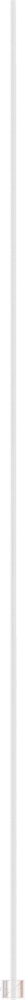

In [11]:
# Plot ROC Curve (for each class)
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_m1[:, i], y_pred_elm[:, i])
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {auc(fpr, tpr):.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='best')
#plt.show()


/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/wakili/anaconda3/envs/mlenv/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.w

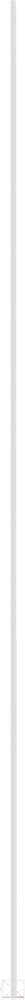

In [9]:
# Plot Precision-Recall Curve (for each class)
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(y_test_m1[:, i], y_pred_elm[:, i])
    plt.plot(recall, precision, label=f'Class {i} (AUC = {auc(recall, precision):.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()


In [10]:
# Create DataFrame for training set
train_results_df = pd.DataFrame({
    'Ground Truth': y_train_m1_labels,
    'Predicted': y_train_pred_elm_labels
})

# Create DataFrame for validation set
validation_results_df = pd.DataFrame({
    'Ground Truth': y_test_m1_labels,
    'Predicted': y_pred_elm_labels
})

# Save to Excel files
train_results_df.to_excel('results/ELM_Training_Results.xlsx', index=False)
validation_results_df.to_excel('results/ELM_Validation_Results.xlsx', index=False)

